In [1]:
# The code was removed by Watson Studio for sharing.

In [2]:
import numpy as np
import random
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.mode.chained_assignment = None

## The following files have been created separately and have been uploaded to project workspace
    DubPostCodes.csv #contains centroid location co-ordinates for Dublin PostCodes
    DubNhood.csv #contains centroid location co-ordinates for Dublin Neighbourhooods within PostCodes
    DubPPR2018.csv #Filtered and cleansed records for properties sold in 2018 in Dublin county only
    dublinplus_geo.json #custom geojson file for Dublin including larger Co Dublin neighbourhoods
    

In [ ]:
#Install packages
!conda install -c conda-forge folium --yes
import folium

!conda install -c conda-forge hdbscan --yes
import hdbscan

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2019.6.16          |           py36_0         148 KB  conda-forge
    branca-0.3.1               |             py_0          25 KB  conda-forge
    altair-3.1.0               |           py36_0         724 KB  conda-forge
    folium-0.9.1               |             py_0          59 KB  conda-forge
    openssl-1.1.1c             |       h516909a_0         2.1 MB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    ca-certificates-2019.6.16  |       hecc5488_0         145 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         3.2 MB

The following NEW packages will be INSTAL

In [4]:
#import PPR Dublin 2018 data
csv_file = project.get_file("DubPPR2018.csv")
csv_file.seek(0)
df_filt2018 = pd.read_csv(csv_file)
#Convert SaleDate to DateTime type
df_filt2018['SaleDate'] = pd.to_datetime(df_filt2018['SaleDate'],format="%d/%m/%Y")
#Reset Location/Neibourhood NaN values
df_filt2018['Location']=df_filt2018['Location'].fillna('')
df_filt2018['Neighbourhood']=df_filt2018['Neighbourhood'].fillna('')
#Adjust Vat Incl price for new builds 13.5% Vat Rate -- Already done and saved/retrieved so comment line
#df_filt2018['Price'] = df_filt2018.apply(lambda row: math.ceil(row['Price']*113.5)/100.0 if (row['VATExcl'] == 1) else row['Price'],axis=1) #,ignore_failures=True

df_filt2018.head(5)

,SaleDate,Address,Neighbourhood,PostCode,County,Location,Price,FullMarketPrice,VATExcl,PropDesc,SizeDesc
0,2018-01-02,19 Ulverton Rd,Dalkey,Co Dublin,Dublin,"53.2809791, -6.107143",1130000.0,0,0,Old,000 - 000
1,2018-01-02,"1 Abbey St, Howth",Howth,Dublin 7,Dublin,"53.3872364, -6.0655199",710000.0,0,0,Old,000 - 000
2,2018-01-02,"1 Roseville, Lower Road",Shankill,Dublin 18,Dublin,"53.233132, -6.125343",627230.7,0,0,Old,000 - 000
3,2018-01-02,51A St Patricks Crescent,Monkstown,Co Dublin,Dublin,"53.2844546, -6.1493957",545000.0,0,0,Old,000 - 000
4,2018-01-02,89 Cromwellsfort Rd,Walkinstown,Dublin 12,Dublin,"53.3171806, -6.3324025",350000.0,0,0,Old,000 - 000


In [5]:
#df_filt2018[df_filt2018.VATExcl==1].head() #(Ex-Vat old results)
df_map=df_filt2018.groupby(['PostCode']).agg({"PropDesc":"count", "Price":"mean"}).reset_index()
#       .rename(columns={'text':'count','sent':'mean_sent'}) \{'Avg':'mean', 'Freq':'count', 'MaxPrice':'max', 'MinPrice':'min'}).reset_index()
df_map.head()

,PostCode,PropDesc,Price
0,Co Dublin,3051,602933.883625
1,Dublin 1,233,497588.283433
2,Dublin 10,120,189378.438833
3,Dublin 11,355,366704.630169
4,Dublin 12,412,355694.813665


In [ ]:
#df_filt2018 = df_filt2018[(df_filt2018['Neighbourhood']=='Castleknock') | (df_filt2018['Neighbourhood']=='Carpenterstown')]

In [6]:
#Determine correlation between average price and properties sold - expected to be weak/insignificant
df_map[['Price','PropDesc']].corr()

,Price,PropDesc
Price,1.000000,0.204324
PropDesc,0.204324,1.000000


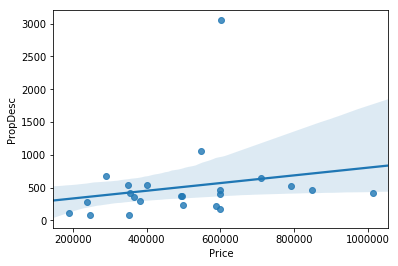

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

#plot regression using SNS regplot
sns.regplot(x="Price", y="PropDesc", data=df_map)

In [8]:
pcode_csv=project.get_file("DubPostCodes.csv") #Load PostCode lookup with centred location co-ordinates
pcode_csv.seek(0)
df_pcodecsv = pd.read_csv(pcode_csv)
df_pcodecsv.head()

,PostCode,Location
0,Dublin 1,"53.3524881,-6.25664568972183"
1,Dublin 2,"53.33894015,-6.25271282175961"
2,Dublin 3,"53.3612231,-6.18546680600004"
3,Dublin 4,"53.32746935,-6.22753692446213"
4,Dublin 5,"53.3834538,-6.18192324547357"


In [9]:
from folium import plugins

dubLat=53.3497645
dubLong=-6.2602732

# Import custom geojson for Dublin with post code boundaries
dublin_geojson = project.get_file("dublinplus_geo.json").read().decode("utf-8")

dublin_map = folium.Map(location=[dubLat,dubLong], zoom_start=12, tiles='OpenStreetMap')

# loop through the postcodes dataframe and add post code labels
for latlng, locn, in zip(df_pcodecsv.Location.str.split(','),df_pcodecsv.PostCode):
    folium.Marker(
        location=[float(i) for i in latlng],
        icon=folium.features.DivIcon(icon_size=(120,24),icon_anchor=(10,20),html='<div style="font-size:10pt;font-weight:bold;color:blue">'+locn+'</div>'),
        popup=None,
    ).add_to(dublin_map)

# instantiate a mark cluster object for the properties in the dataframe
props = plugins.MarkerCluster().add_to(dublin_map)

    # loop through the dataframe and add each data point to the mark cluster
for latlng, label,locn, in zip(df_filt2018.Location.str.split(','),df_filt2018.Neighbourhood+' : ' + df_filt2018.SaleDate.astype(str)+' : €'+df_filt2018.Price.astype(str),df_filt2018.PostCode):
    folium.Marker(
        location=[float(i) for i in latlng],
        icon=None,
        popup=label,
    ).add_to(props)

folium.Choropleth(
    geo_data=dublin_geojson,
    data=df_map,
    columns=['PostCode', 'Price'],
    key_on='feature.properties.postal',
    fill_color='YlGnBu', #'PuBuGn', 'YlOrBr', 'YlOrRd' are the other triple colour scheme options
    fill_opacity=0.8, 
    line_opacity=0.3,
    legend_name='Dublin Property Prices 2018',
    reset=True
).add_to(dublin_map)

dublin_map

In [10]:
project.save_data("DublinPPR2018a.html", dublin_map.get_root().render(), overwrite=True)

{'file_name': 'DublinPPR2018a.html',
 'message': 'File saved to project storage.',
 'bucket_name': 'courseracapstone-donotdelete-pr-teb93tufaaikgo',
 'asset_id': '4f4810d5-af84-4c36-90d6-8d256637e272'}

In [11]:
import requests # url request
import json # library to handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

#results = requests.get(url).json()

In [12]:
VERSION='20190630'
LIMIT = 25 # limit of number of venues returned by Foursquare API
radius = 3000 # define radius

def getNearbyVenues(names, location):
    
    venues_list=[]

    for name, latlng in zip(names, location):
        #print(name)
        lat = float(latlng.split(',')[0])
        lng = float(latlng.split(',')[-1])
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [13]:
#Summarise by postcode + neighbourhood and determine property count and average price
df_nhood=df_filt2018[(df_filt2018['Neighbourhood']>'') & (df_filt2018['PropDesc']=='Old')].groupby(['PostCode','Neighbourhood']).agg({"PropDesc":"count", "Price":"mean"}).reset_index()
#Eliminate neighbourhoods with less than 5 properties as this skews and too low a sample
df_nhood=df_nhood[df_nhood.PropDesc>=5]
df_nhood.head()

,PostCode,Neighbourhood,PropDesc,Price
0,Co Dublin,Adamstown,9,227666.000000
1,Co Dublin,Balbriggan,148,210515.506014
3,Co Dublin,Ballybrack,29,332517.241379
6,Co Dublin,Balrothery,6,316166.666667
7,Co Dublin,Blackrock,214,752033.934579


In [14]:
nhood_csv=project.get_file("DubNhood.csv") #Load Neighbourhood lookup with centred location co-ordinates
nhood_csv.seek(0)
df_ncsv = pd.read_csv(nhood_csv)

df_ncsv.head()

,PostCode,Neighbourhood,Location
0,Dublin 1,Abbey Street,"53.3486882, -6.2578235"
1,Dublin 1,Amiens street,"53.3528355, -6.2487534"
2,Dublin 1,Capel street,"53.3474219, -6.2684092"
3,Dublin 1,Dorset street,"53.3585094, -6.2627738"
4,Dublin 1,Henry street,"53.3495488, -6.2619787"


In [15]:
df_dub=pd.merge(df_nhood,df_ncsv, left_on=['PostCode','Neighbourhood'], right_on = ['PostCode','Neighbourhood'])
df_dub = df_dub.rename(columns={'PropDesc': 'PropCount'})
df_dub.head()

,PostCode,Neighbourhood,PropCount,Price,Location
0,Co Dublin,Adamstown,9,227666.000000,"53.3360017, -6.4692321"
1,Co Dublin,Balbriggan,148,210515.506014,"53.609832, -6.1861964"
2,Co Dublin,Ballybrack,29,332517.241379,"53.252448, -6.1266112"
3,Co Dublin,Balrothery,6,316166.666667,"53.5877338, -6.1880637"
4,Co Dublin,Blackrock,214,752033.934579,"53.3018639, -6.1788342"


In [16]:
dub_venues = getNearbyVenues(names=df_dub['Neighbourhood'],location=df_dub['Location'])
#Read from CSV if unable to query API online
#venues_file = project.get_file("Dub2018venues.csv")
#venues_file.seek(0)
#dub_venues = pd.read_csv(venues_file)

print(dub_venues.shape)

dub_venues.head()

(2754, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Adamstown,53.336002,-6.469232,Finnstown Castle Hotel,53.339602,-6.460888,Hotel
1,Adamstown,53.336002,-6.469232,Starbucks,53.348021,-6.452001,Coffee Shop
2,Adamstown,53.336002,-6.469232,Carroll's Gastro Pub,53.357185,-6.449636,Pub
3,Adamstown,53.336002,-6.469232,Kenny's of Lucan,53.357144,-6.450473,Gastropub
4,Adamstown,53.336002,-6.469232,Courtneys,53.356276,-6.450117,Pub


In [17]:
#Save Foursquare nearby venues to csv as it is sometimes unreliable to query
#Execute only if previous cell execution was successful!
project.save_data("Dub2018venues.csv", dub_venues.to_csv(index=False), overwrite=True)

{'file_name': 'Dub2018venues.csv',
 'message': 'File saved to project storage.',
 'bucket_name': 'courseracapstone-donotdelete-pr-teb93tufaaikgo',
 'asset_id': '7857fa77-09a9-4283-950f-38d569249696'}

In [18]:
# one hot encoding
dub_onehot = pd.get_dummies(dub_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
dub_onehot['Neighborhood'] = dub_venues['Neighborhood']
# move neighborhood column to the first column
fixed_columns = [dub_onehot.columns[-1]] + list(dub_onehot.columns[:-1])
dub_onehot = dub_onehot[fixed_columns]
dub_onehot.head()

,Neighborhood,Airport,Airport Lounge,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bar,Basketball Stadium,Beach,Beer Bar,Bistro,Bookstore,Botanical Garden,Breakfast Spot,Brewery,Bridge,Buffet,Burger Joint,Burrito Place,Bus Stop,Cafeteria,Café,Canal,Castle,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comic Shop,Convenience Store,Creperie,Deli / Bodega,Department Store,Diner,Discount Store,Dive Bar,Donut Shop,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Hill,Historic Site,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Island,Italian Restaurant,Japanese Restaurant,Juice Bar,Korean Restaurant,Light Rail Station,Lighthouse,Liquor Store,Lounge,Market,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Monument / Landmark,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nightclub,Paintball Field,Park,Performing Arts Venue,Pet Store,Pharmacy,Pier,Pizza Place,Platform,Playground,Plaza,Pool,Portuguese Restaurant,Pub,Racetrack,Recreation Center,Rental Car Location,Restaurant,Rock Climbing Spot,Rugby Pitch,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shopping Mall,Ski Area,Soccer Field,Soccer Stadium,Spa,Sporting Goods Shop,Sports Club,Stadium,Steakhouse,Street Food Gathering,Supermarket,Surf Spot,Sushi Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Tourist Information Center,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Waterfront,Windmill,Wine Bar,Wine Shop,Wings Joint,Zoo,Zoo Exhibit
0,Adamstown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Adamstown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Adamstown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Adamstown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Adamstown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [19]:
dub_grouped = dub_onehot.groupby('Neighborhood').mean().reset_index()
dub_grouped.head()

,Neighborhood,Airport,Airport Lounge,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bar,Basketball Stadium,Beach,Beer Bar,Bistro,Bookstore,Botanical Garden,Breakfast Spot,Brewery,Bridge,Buffet,Burger Joint,Burrito Place,Bus Stop,Cafeteria,Café,Canal,Castle,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comic Shop,Convenience Store,Creperie,Deli / Bodega,Department Store,Diner,Discount Store,Dive Bar,Donut Shop,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Hill,Historic Site,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Island,Italian Restaurant,Japanese Restaurant,Juice Bar,Korean Restaurant,Light Rail Station,Lighthouse,Liquor Store,Lounge,Market,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Monument / Landmark,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nightclub,Paintball Field,Park,Performing Arts Venue,Pet Store,Pharmacy,Pier,Pizza Place,Platform,Playground,Plaza,Pool,Portuguese Restaurant,Pub,Racetrack,Recreation Center,Rental Car Location,Restaurant,Rock Climbing Spot,Rugby Pitch,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shopping Mall,Ski Area,Soccer Field,Soccer Stadium,Spa,Sporting Goods Shop,Sports Club,Stadium,Steakhouse,Street Food Gathering,Supermarket,Surf Spot,Sushi Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Tourist Information Center,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Waterfront,Windmill,Wine Bar,Wine Shop,Wings Joint,Zoo,Zoo Exhibit
0,Adamstown,0.04,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.04,0.00,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.04,0.0,0.08,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.080,0.00,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.08,0.0,0.0,0.0,0.00,0.0,0.0,0.04,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.160,0.0,0.0,0.00,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.04,0.0,0.04,0.0,0.0,0.0,0.0,0.0,0.080,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.08,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.04,0.04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Artane,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.04,0.0,0.040,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.08,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000,0.04,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.04,0.0,0.00,0.0,0.0,0.0,0.04,0.0,0.040,0.0,0.0,0.04,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.160,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.04,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.16,0.00,0.0,0.0,0.0,0.00,0.04,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Ashtown,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.00,0.0,0.04,0.00,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.16,0.0,0.0,0.08,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.000,0.00,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.04,0.0,0.0,0.0,0.00,0.0,0.040,0.0,0.0,0.00,0.0,0.0,0.0,0.0

In [20]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 4

for hood in dub_grouped['Neighborhood']:
    temp = dub_grouped[dub_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = dub_grouped['Neighborhood']

for ind in np.arange(dub_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(dub_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue
0,Adamstown,Hotel,Supermarket,Café,Fast Food Restaurant
1,Artane,Pub,Supermarket,Café,Hotel
2,Ashtown,Pub,Café,Park,Chinese Restaurant
3,Balbriggan,Supermarket,Hotel,Fast Food Restaurant,Food Court
4,Baldoyle,Train Station,Supermarket,Hotel,Tennis Court


In [21]:
dub_grouped['Price']=df_dub['Price'].fillna(0.0)
#dub_grouped['PropCount']=df_dub['PropCount'].fillna(0.0)
fixed_columns = [dub_grouped.columns[-1]] + list(dub_grouped.columns[:-1])
dub_grouped = dub_grouped[fixed_columns]
dub_grouped_clustering = dub_grouped.drop('Neighborhood', 1)
dub_grouped_clustering.head()

,Price,Airport,Airport Lounge,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bar,Basketball Stadium,Beach,Beer Bar,Bistro,Bookstore,Botanical Garden,Breakfast Spot,Brewery,Bridge,Buffet,Burger Joint,Burrito Place,Bus Stop,Cafeteria,Café,Canal,Castle,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comic Shop,Convenience Store,Creperie,Deli / Bodega,Department Store,Diner,Discount Store,Dive Bar,Donut Shop,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Hill,Historic Site,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Island,Italian Restaurant,Japanese Restaurant,Juice Bar,Korean Restaurant,Light Rail Station,Lighthouse,Liquor Store,Lounge,Market,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Monument / Landmark,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nightclub,Paintball Field,Park,Performing Arts Venue,Pet Store,Pharmacy,Pier,Pizza Place,Platform,Playground,Plaza,Pool,Portuguese Restaurant,Pub,Racetrack,Recreation Center,Rental Car Location,Restaurant,Rock Climbing Spot,Rugby Pitch,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shopping Mall,Ski Area,Soccer Field,Soccer Stadium,Spa,Sporting Goods Shop,Sports Club,Stadium,Steakhouse,Street Food Gathering,Supermarket,Surf Spot,Sushi Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Tourist Information Center,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Waterfront,Windmill,Wine Bar,Wine Shop,Wings Joint,Zoo,Zoo Exhibit
0,227666.000000,0.04,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.04,0.00,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.04,0.0,0.08,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.080,0.00,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.08,0.0,0.0,0.0,0.00,0.0,0.0,0.04,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.160,0.0,0.0,0.00,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.04,0.0,0.04,0.0,0.0,0.0,0.0,0.0,0.080,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.08,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.04,0.04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,210515.506014,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.04,0.0,0.040,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.08,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000,0.04,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.04,0.0,0.00,0.0,0.0,0.0,0.04,0.0,0.040,0.0,0.0,0.04,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.160,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.04,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.16,0.00,0.0,0.0,0.0,0.00,0.04,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,332517.241379,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.0,0.00,0.0,0.04,0.00,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.16,0.0,0.0,0.08,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.04,0.0,0.000,0.00,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.04,0.0,0.0,0.0,0.00,0.0,0.040,0.0,0.0,0.00,0.0,0

In [22]:
#import k-means from clustering stage
from sklearn.cluster import KMeans
#from sklearn.preprocessing import MinMaxScaler

kclusters = 5
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0) #.fit(dub_grouped_clustering)

#dub_grouped_scaled = MinMaxScaler().fit_transform(dub_grouped_clustering)

kmeans.fit(dub_grouped_clustering)

kmeans.labels_[0:10]

array([0, 0, 0, 0, 3, 3, 2, 0, 3, 3], dtype=int32)

In [23]:
#Also try HDBSCAN clustering as an alternative to KMeans
hclusters=6
hdb = hdbscan.HDBSCAN(min_cluster_size=hclusters)
hdb_pred = hdb.fit(dub_grouped_clustering)
hdb_pred.labels_[0:10]

array([ 2, -1,  1,  1, -1, -1, -1,  1, -1, -1])

In [24]:
dub_merged = df_dub[(df_dub.Neighbourhood.isin(dub_grouped['Neighborhood']))].sort_values('Neighbourhood')

dub_merged=dub_merged.drop_duplicates(['Neighbourhood']).reset_index().drop('index', 1)

# add clustering labels for KMeans and HDBSCAN
dub_merged['KMeansCluster'] = kmeans.labels_
dub_merged['HDBSCANCluster'] = hdb_pred.labels_

# merge dublin_grouped with df_dub to add location data for each neighborhood
dub_merged = dub_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighbourhood')

#Assign a categorical rating for price
dub_merged['Category'] = pd.cut(dub_merged['Price'],[-np.inf, 300000, 500000, 800000,np.inf],labels=['Down-market', 'Low-middle', 'Middle-market', 'Up-market'])
dub_merged.head()

,PostCode,Neighbourhood,PropCount,Price,Location,KMeansCluster,HDBSCANCluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,Category
0,Co Dublin,Adamstown,9,227666.000000,"53.3360017, -6.4692321",0,2,Hotel,Supermarket,Café,Fast Food Restaurant,Down-market
1,Dublin 5,Artane,93,350579.389570,"53.3825, -6.2025",0,-1,Pub,Supermarket,Café,Hotel,Low-middle
2,Dublin 7,Ashtown,78,258285.730513,"53.3752597, -6.34113369304549",0,1,Pub,Café,Park,Chinese Restaurant,Down-market
3,Co Dublin,Balbriggan,148,210515.506014,"53.609832, -6.1861964",0,1,Supermarket,Hotel,Fast Food Restaurant,Food Court,Down-market
4,Dublin 13,Baldoyle,53,378557.417925,"53.3958303, -6.1285497",3,-1,Train Station,Supermarket,Hotel,Tennis Court,Low-middle


In [25]:
import matplotlib.cm as cm
import matplotlib.colors as colors

In [26]:
# create KMeans map
map_kclusters = folium.Map(location=[dubLat, dubLong], zoom_start=11)

# loop through the postcodes dataframe and add post code labels
for latlng, locn, in zip(df_pcodecsv.Location.str.split(','),df_pcodecsv.PostCode):
    folium.Marker(
        location=[float(i) for i in latlng],
        icon=folium.features.DivIcon(icon_size=(120,24),icon_anchor=(10,20),html='<div style="font-size:10pt;font-weight:bold;color:blue">'+locn+'</div>'),
        popup=None,
    ).add_to(map_kclusters)
    
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for latlng, poi, cluster in zip(dub_merged['Location'], dub_merged['Neighbourhood'], dub_merged['KMeansCluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    lat = float(latlng.split(',')[0])
    lng = float(latlng.split(',')[-1])
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_kclusters)
       
map_kclusters

In [27]:
# create HDBSCAN map
map_hclusters = folium.Map(location=[dubLat, dubLong], zoom_start=11)

hnum = len(dub_merged.HDBSCANCluster.unique())

# set color scheme for the clusters
x = np.arange(hnum)
ys = [i+x+(i*x)**2 for i in range(hnum)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
# loop through the postcodes dataframe and add post code labels
for latlng, locn, in zip(df_pcodecsv.Location.str.split(','),df_pcodecsv.PostCode):
    folium.Marker(
        location=[float(i) for i in latlng],
        icon=folium.features.DivIcon(icon_size=(120,24),icon_anchor=(10,20),html='<div style="font-size:10pt;font-weight:bold;color:blue">'+locn+'</div>'),
        popup=None,
    ).add_to(map_hclusters)

for latlng, poi, cluster in zip(dub_merged['Location'], dub_merged['Neighbourhood'], dub_merged['HDBSCANCluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    lat = float(latlng.split(',')[0])
    lng = float(latlng.split(',')[-1])
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_hclusters)
       
map_hclusters

In [28]:
#project.save_data("DubPPR2018.csv", df_filt2018.to_csv(index=False,date_format='%d/%m/%Y'), overwrite=True)
project.save_data("Dub2018Clus.csv", dub_merged.to_csv(index=False,date_format='%d/%m/%Y'), overwrite=True)

{'file_name': 'Dub2018Clus.csv',
 'message': 'File saved to project storage.',
 'bucket_name': 'courseracapstone-donotdelete-pr-teb93tufaaikgo',
 'asset_id': '5c03ddbd-3a78-420a-ab6d-2723e0022780'}

In [29]:
project.save_data("DublinKMeans.html", map_kclusters.get_root().render(), overwrite=True)

{'file_name': 'DublinKMeans.html',
 'message': 'File saved to project storage.',
 'bucket_name': 'courseracapstone-donotdelete-pr-teb93tufaaikgo',
 'asset_id': '77e40d33-8b63-4b6f-9ee9-41c3433a0d1e'}

In [30]:
project.save_data("DublinHDBSCAN.html", map_hclusters.get_root().render(), overwrite=True)

{'file_name': 'DublinHDBSCAN.html',
 'message': 'File saved to project storage.',
 'bucket_name': 'courseracapstone-donotdelete-pr-teb93tufaaikgo',
 'asset_id': 'd666c8e2-53a9-4e77-b1d1-6f4106d1d512'}

In [31]:
dub_merged.groupby('KMeansCluster').agg({"PropCount":"sum", "Price":["mean","min","max"], "Neighbourhood":"count"}).reset_index(drop=True)

PropCount          Price                              Neighbourhood
        sum           mean            min           max         count
0      3522  425962.878346  189307.270505  1.209408e+06            65
1      1643  459254.019791  215000.000000  9.283775e+05            27
2       295  591150.527291  155911.110000  1.471126e+06             7
3       927  495265.708512  225428.877296  1.021928e+06            15
4        19  228904.475789  228904.475789  2.289045e+05             1

In [32]:
#dub_merged.loc[dub_merged['Cluster'] == 1, dub_merged.columns[[1] + list(range(5, dub_merged.shape[1]))]]
len(pd.unique(dub_merged[['1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue','4th Most Common Venue']].values.ravel('K')))

60

In [33]:
#function to generate a mask across common venue column string pattern contents
def get_mask(df, strcontains):
    return df['1st Most Common Venue'].str.contains(strcontains)|df['2nd Most Common Venue'].str.contains(strcontains)|df['3rd Most Common Venue'].str.contains(strcontains)|df['4th Most Common Venue'].str.contains(strcontains)

In [34]:
#Sample list of neighbourhoods with most property sales that do not have a popular eatery venue nearby per FourSquare API data)
#using a mask of string patterns to eliminate from dataset
curmask=get_mask(dub_merged,'Restaurant')| \
        get_mask(dub_merged,'Burger')| \
        get_mask(dub_merged,'Café')| \
        get_mask(dub_merged,'Coffee')| \
        get_mask(dub_merged,'Diner')| \
        get_mask(dub_merged,'Food')| \
        get_mask(dub_merged,'Pizza')
dub_merged[~curmask].sort_values('PropCount',ascending=False).head() # Note the tilde symbol for the not operator!

,PostCode,Neighbourhood,PropCount,Price,Location,KMeansCluster,HDBSCANCluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,Category
108,Co Dublin,Swords,223,311798.782287,"53.4598264, -6.2184562",3,-1,Supermarket,Bar,Pub,Hotel,Low-middle
98,Dublin 9,Santry,92,298897.894891,"53.3971578, -6.2454723",3,-1,Supermarket,Hotel,Gym,Park,Down-market
113,Dublin 12,Walkinstown,68,345694.294118,"53.3216133, -6.3301177",1,0,Supermarket,Bar,Park,Deli / Bodega,Low-middle
105,Co Dublin,Stillorgan,57,556234.421053,"53.2888378, -6.198343",0,1,Bar,Hotel,Wine Shop,Bistro,Middle-market
4,Dublin 13,Baldoyle,53,378557.417925,"53.3958303, -6.1285497",3,-1,Train Station,Supermarket,Hotel,Tennis Court,Low-middle


In [35]:
#Sample list of neighbourhoods with most property sales that have a popular public transport venue
#Would be of interest for buy-for-let property seekers 
curmask=get_mask(dub_merged,'Train')| \
        get_mask(dub_merged,'Rail')| \
        get_mask(dub_merged,'Tram')| \
        get_mask(dub_merged,'Bus')| \
        get_mask(dub_merged,'Luas')
dub_merged[curmask].sort_values('PropCount',ascending=False).head()

,PostCode,Neighbourhood,PropCount,Price,Location,KMeansCluster,HDBSCANCluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,Category
4,Dublin 13,Baldoyle,53,378557.417925,"53.3958303, -6.1285497",3,-1,Train Station,Supermarket,Hotel,Tennis Court,Low-middle
26,Dublin 13,Clongriffin,21,227952.428571,"53.4026399, -6.151014",1,0,Supermarket,Train Station,Coffee Shop,Golf Course,Down-market
74,Co Dublin,Newcastle,11,297363.636364,"53.2999844, -6.5013576",0,1,Pub,Golf Driving Range,Bus Stop,Fast Food Restaurant,Down-market


In [36]:
#Determine correlation between the two clustering algorithms
dub_merged[['KMeansCluster','HDBSCANCluster']].corr()

,KMeansCluster,HDBSCANCluster
KMeansCluster,1.000000,-0.716607
HDBSCANCluster,-0.716607,1.000000
